In [1]:
import urllib.request
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import math
from skimage.measure import compare_ssim as ssim

In [2]:
def show(img):
    plt.figure(figsize = (30,30))
    plt.imshow((img-img.min())/(img.max()-img.min()))

In [3]:
def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

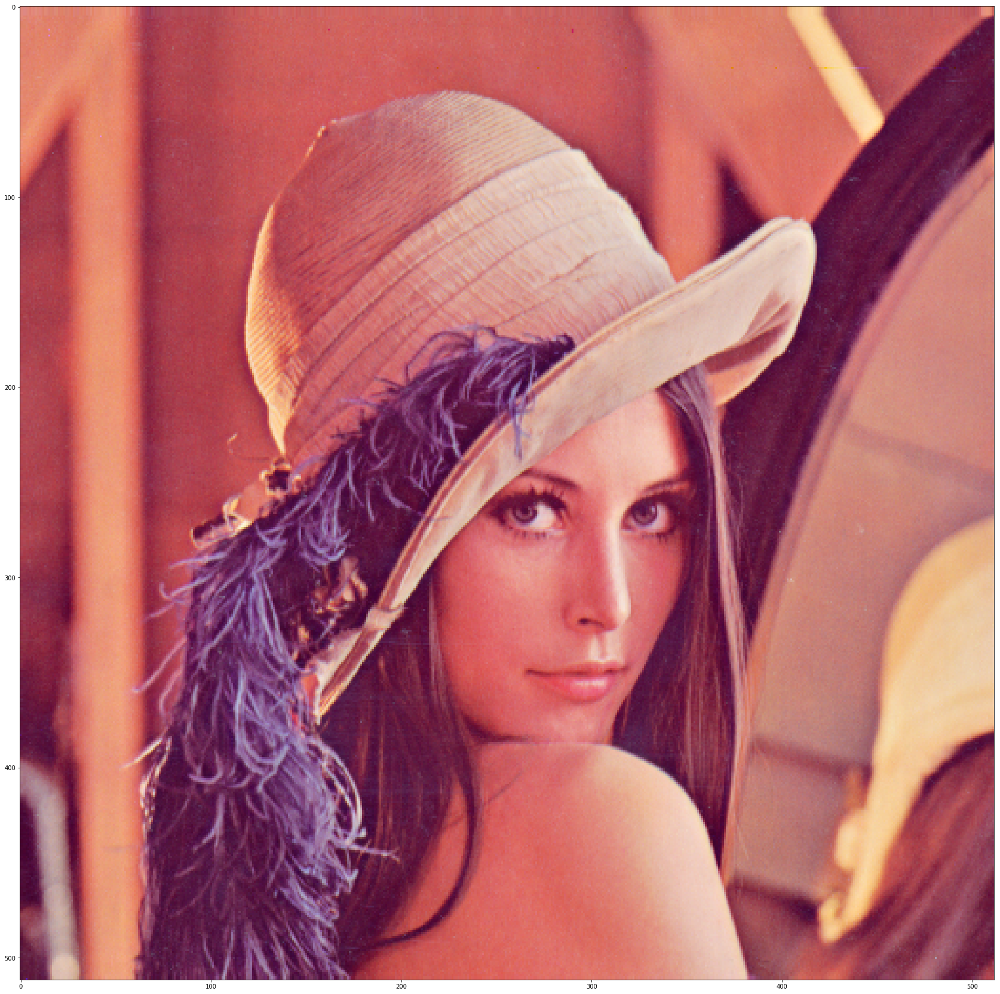

In [4]:
HTTP_response = urllib.request.urlopen('http://www.hpca.ual.es/~vruiz/images/lena.png')
arr = np.asarray(bytearray(HTTP_response.read()), dtype=np.uint8)
BGR = cv2.imdecode(arr,-1)
image = cv2.cvtColor(BGR, cv2.COLOR_BGR2RGB)
show(image)

In [5]:
# Wavelet machinery

import pywt

# Sólo por ver los distintos filtros que hay disponibles
print (pywt.wavelist())

# Seleccionamos una en concreto 
#wavelet = 'db9' # http://wavelets.pybytes.com/wavelet/db9/
wavelet = 'db5' # http://wavelets.pybytes.com/wavelet/db9/
#wavelet = 'haar'
#wavelet='rbio3.5'
#wavelet='rbio1.1'
#wavelet='bior3.5'
#wavelet='coif7'
#wavelet='coif5'
mode='per'

['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'cgau1', 'cgau2', 'cgau3', 'cgau4', 'cgau5', 'cgau6', 'cgau7', 'cgau8', 'cmor', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7', 'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15', 'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28', 'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38', 'dmey', 'fbsp', 'gaus1', 'gaus2', 'gaus3', 'gaus4', 'gaus5', 'gaus6', 'gaus7', 'gaus8', 'haar', 'mexh', 'morl', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'shan', 'sym2', 'sym3

In [6]:
component = cv2.split(image)

In [7]:
def DWT(image, wavelet):
    return pywt.dwt2(image, wavelet, mode='per')

In [8]:
def iDWT(subbands, wavelet):
    return pywt.idwt2(subbands, wavelet, mode='per')

In [9]:
#levels = 5
#L = component
#H = [None]*3
#for c in range(3):
#    H[c] = [None]*levels
#    for l in range(levels):
#        L[c], H[c][l] = DWT(L[c], wavelet)
#show(cv2.merge(L))

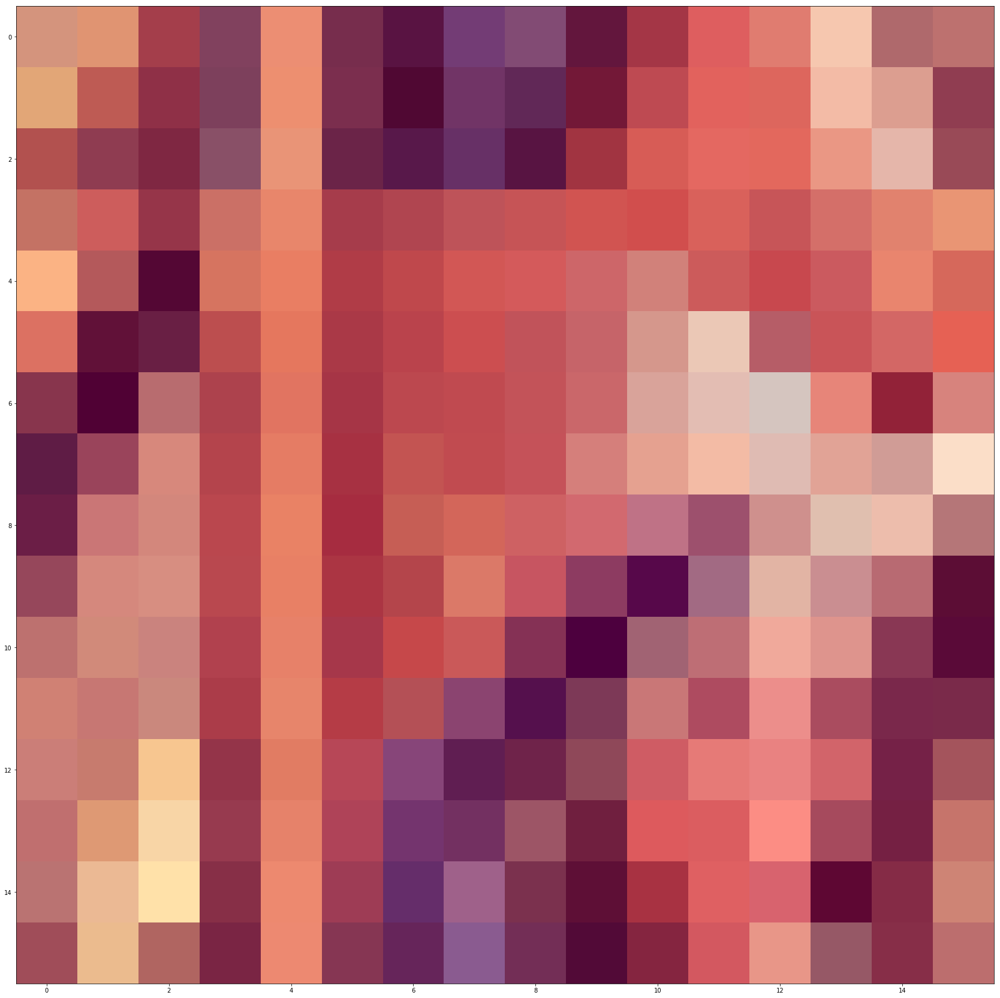

In [10]:
levels = 5
L = component

H = levels*[None]
for l in range(levels):
    H[l] = 3*[None]
    for c in range(3):
        L[c], H[l][c] = DWT(L[c], wavelet)

show(cv2.merge(L))

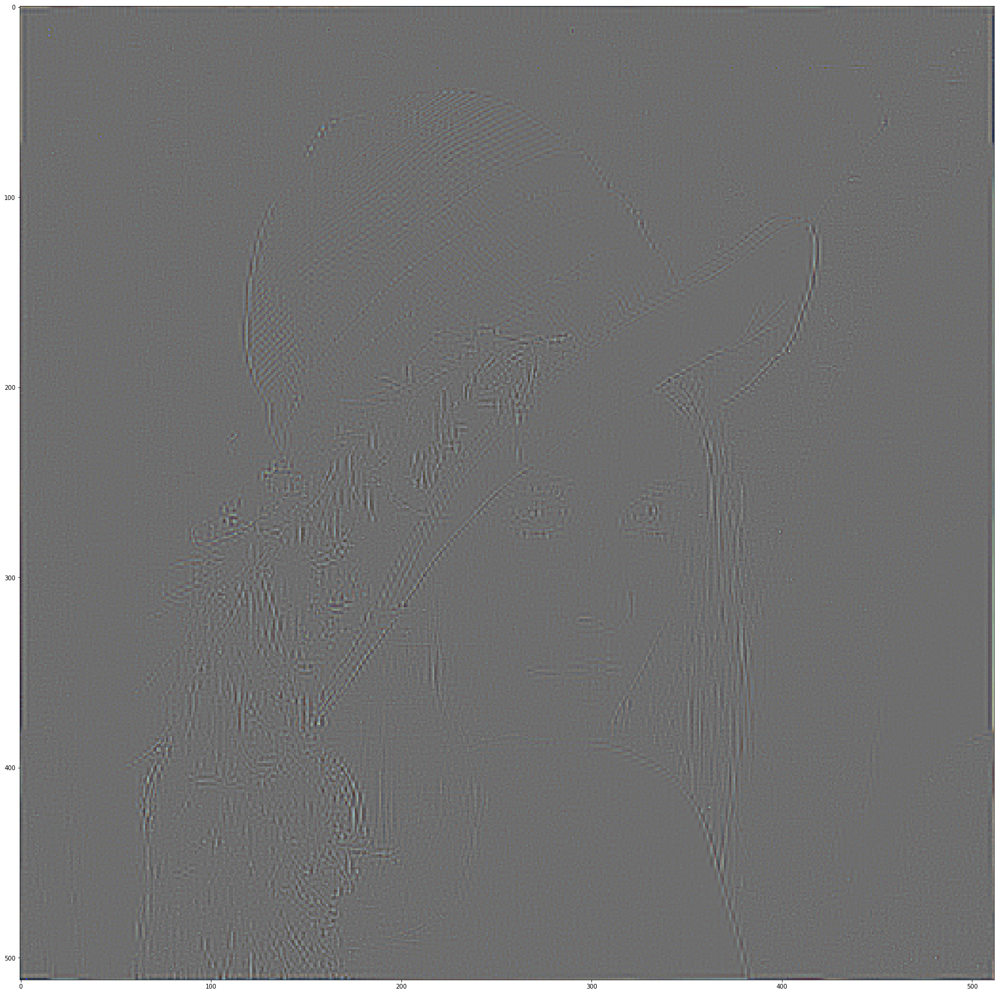

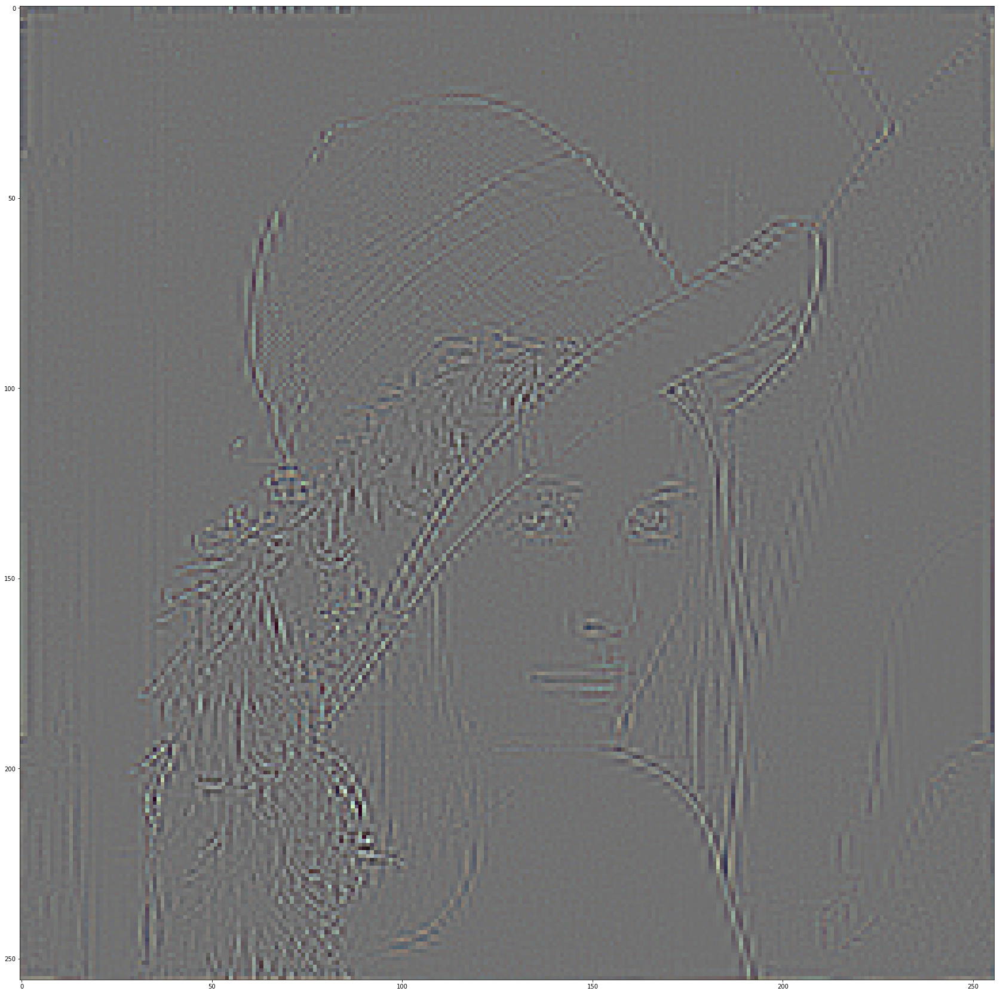

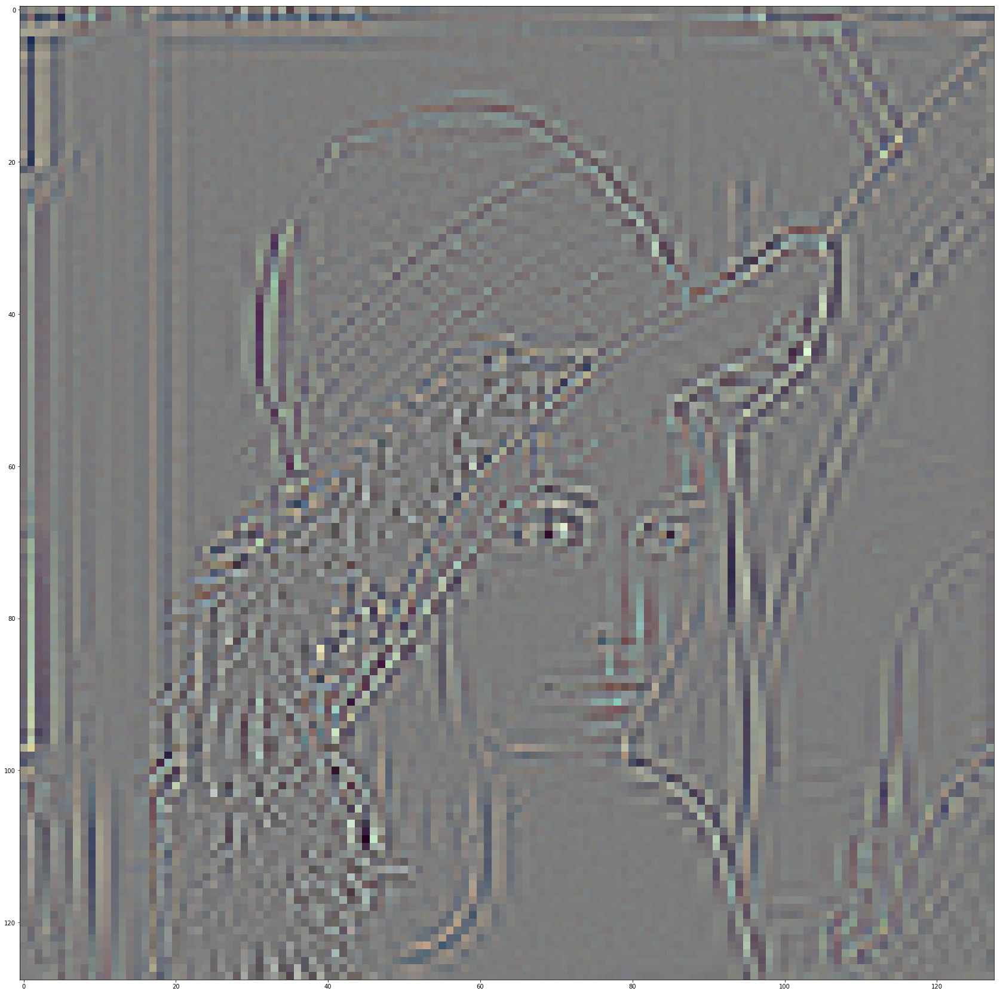

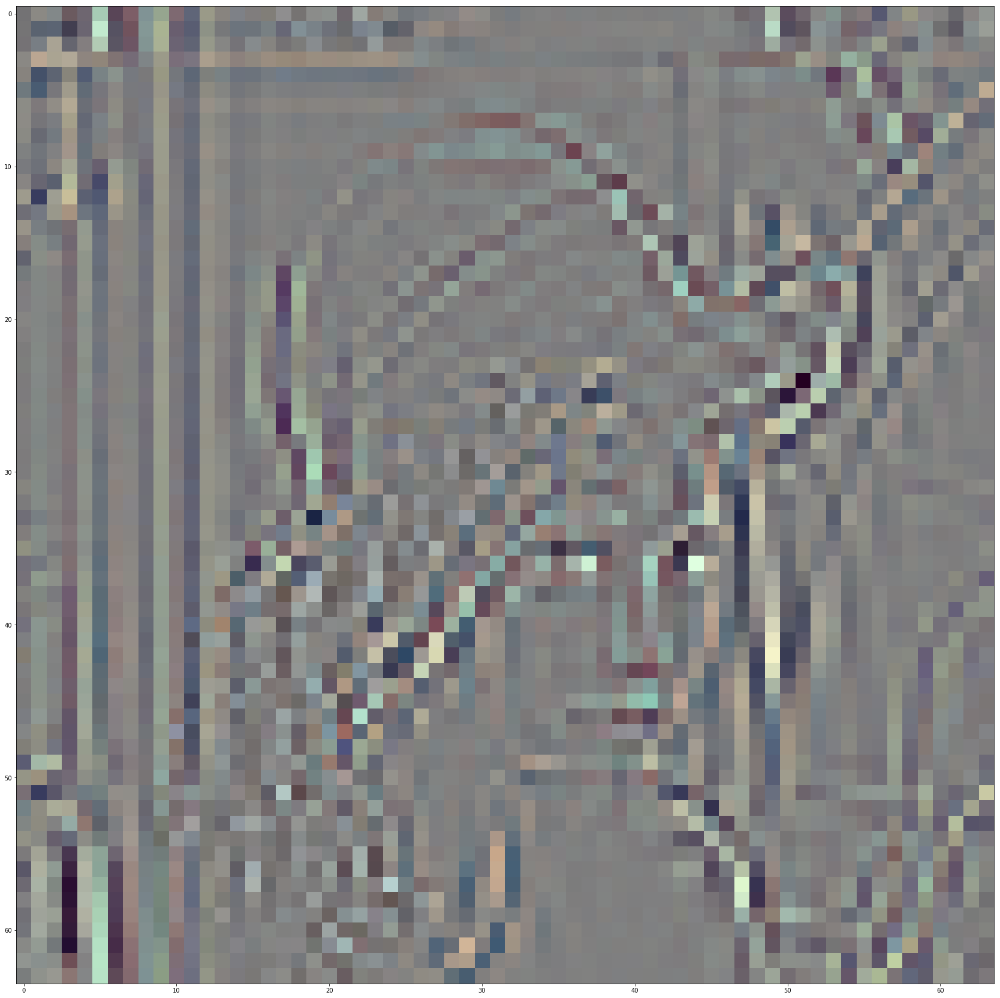

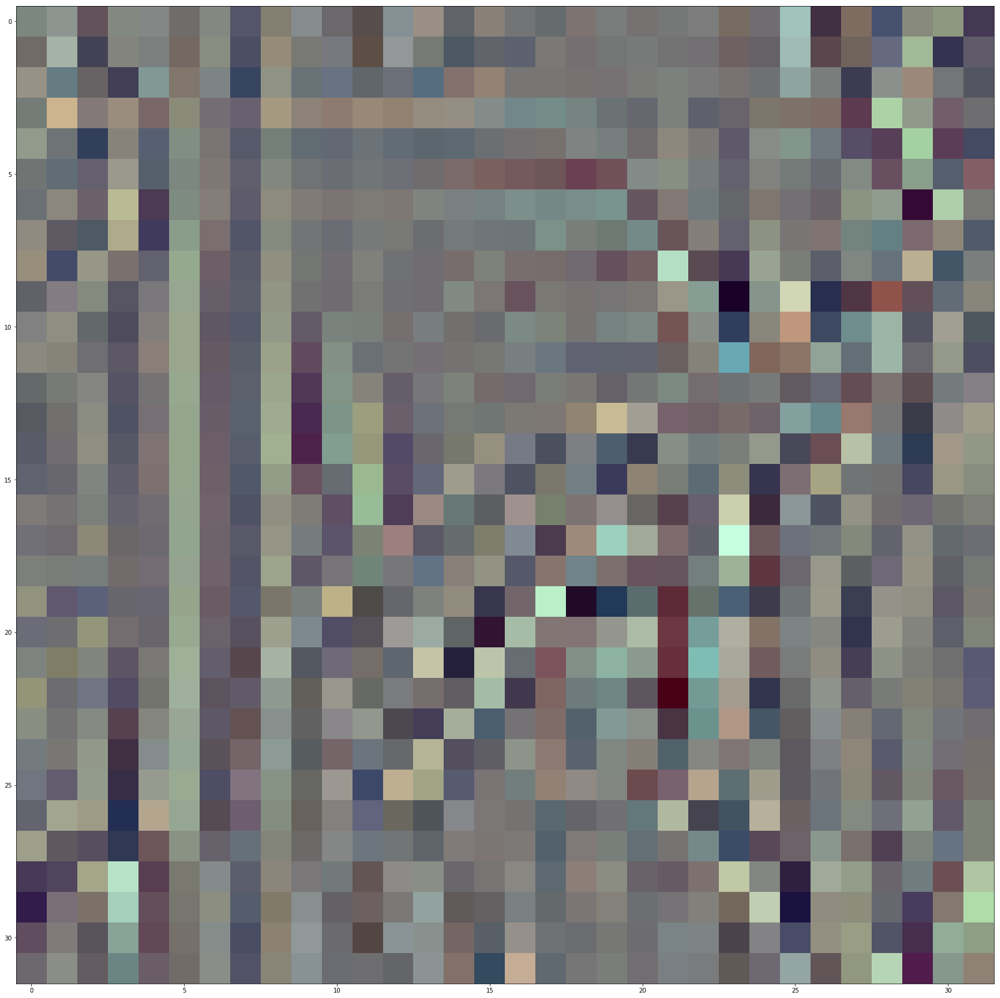

In [11]:
# Laplacian pyramid

_H_ = levels*[None]
for l in range(levels):
    _H_[l] = 3*[None]
    zero = np.zeros(H[l][0][0].shape, np.float32)
    for c in range(3):
        _H_[l][c] = iDWT((zero, H[l][c]), wavelet)
    show(cv2.merge(_H_[l]))

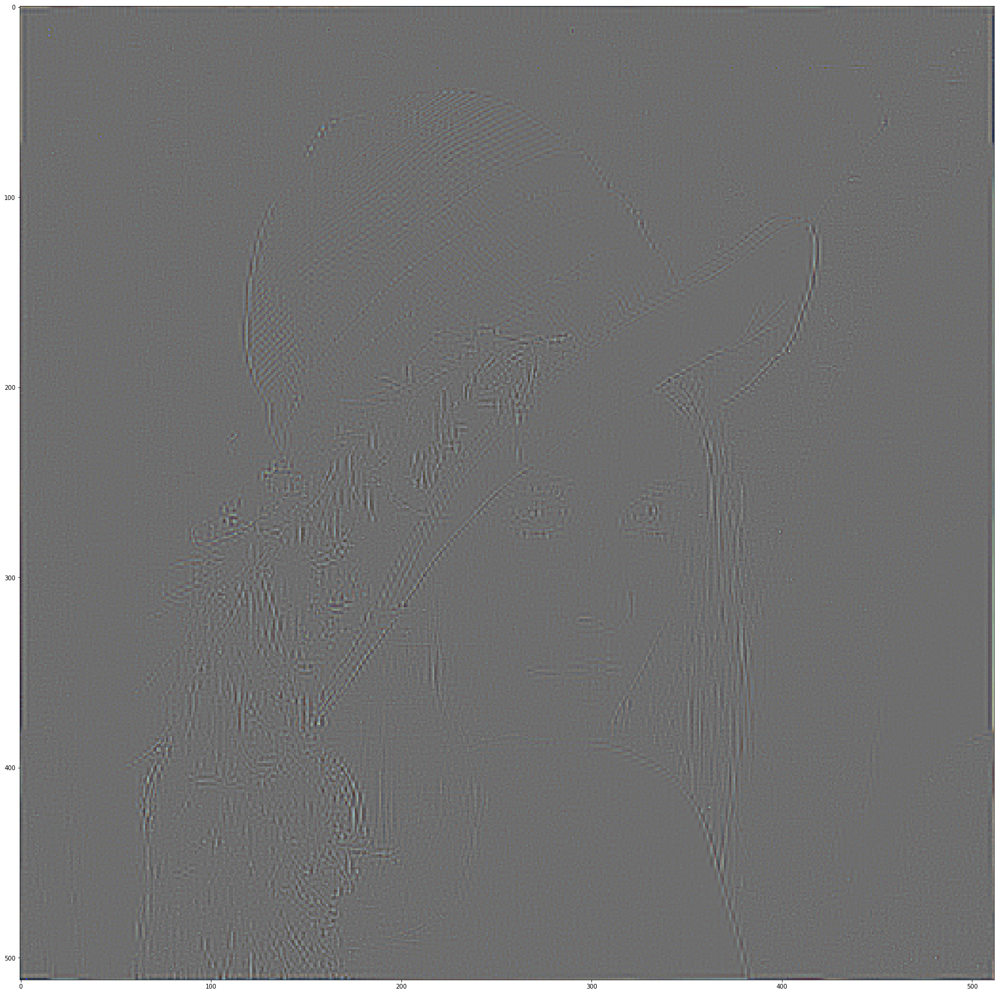

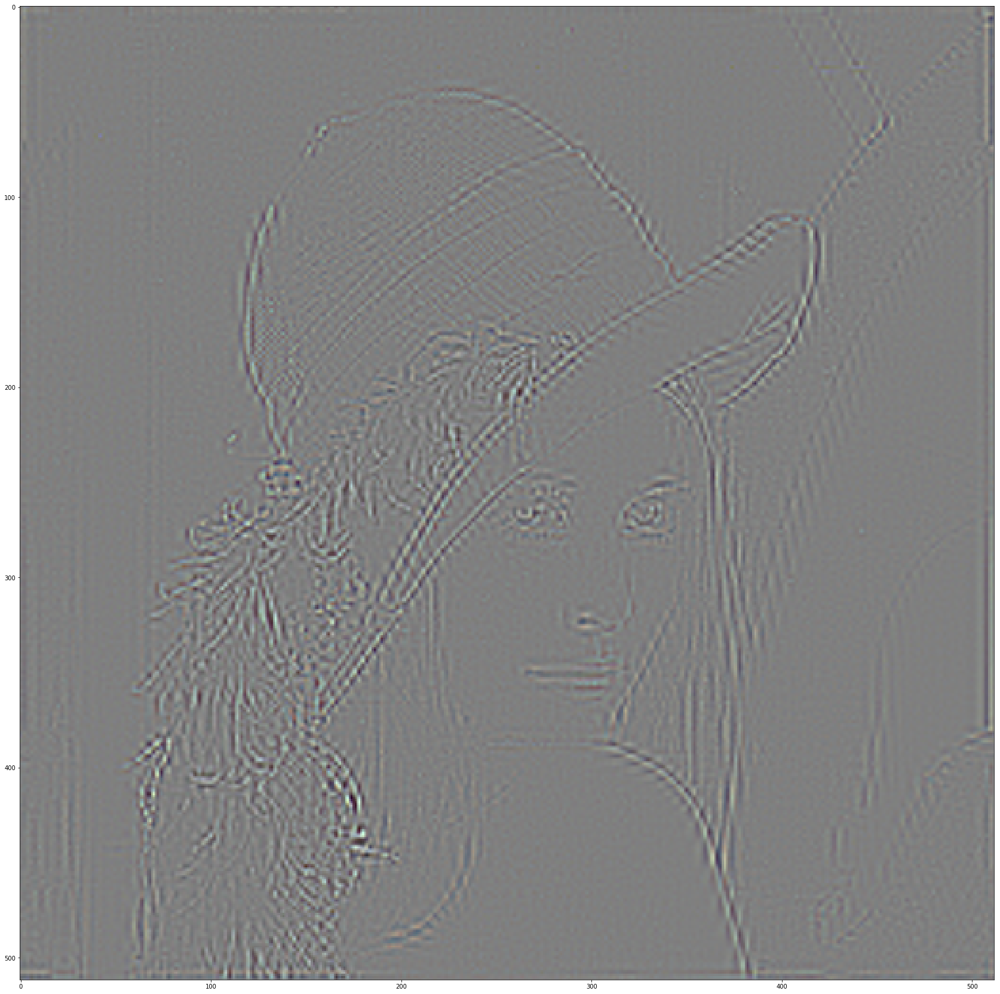

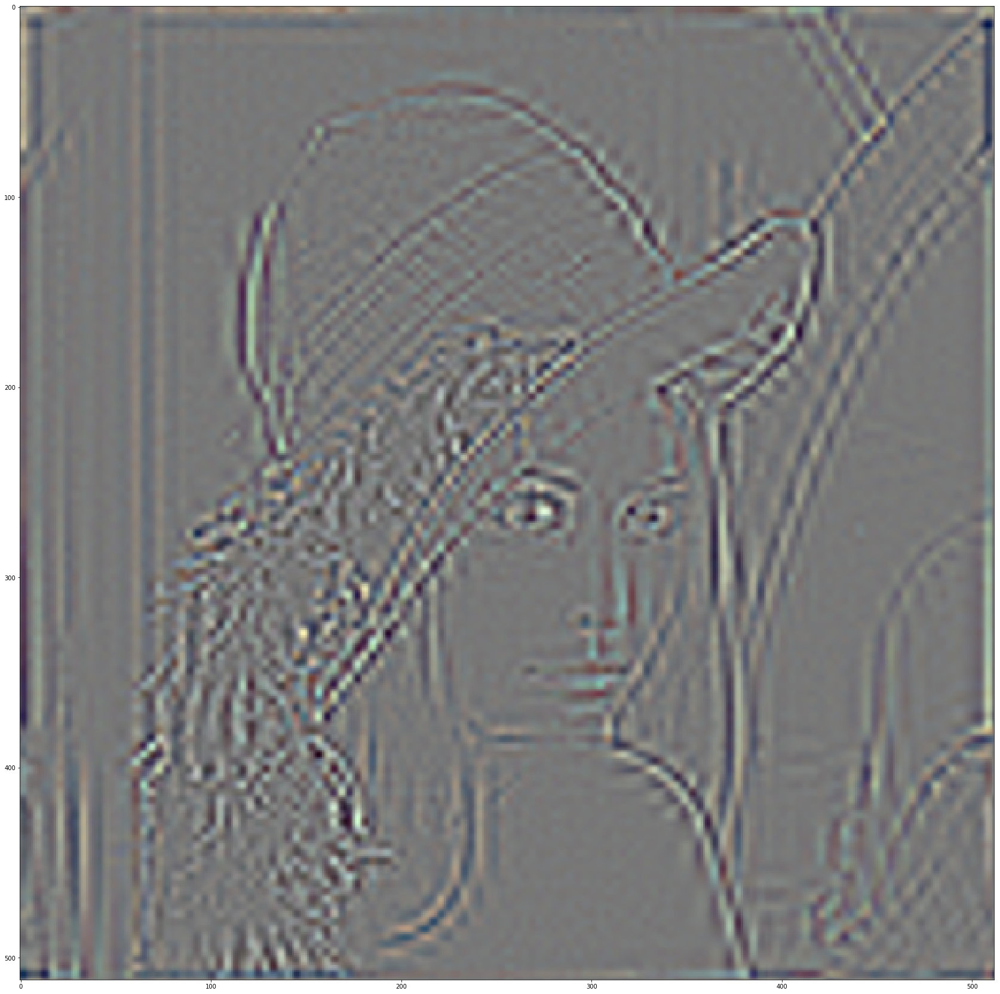

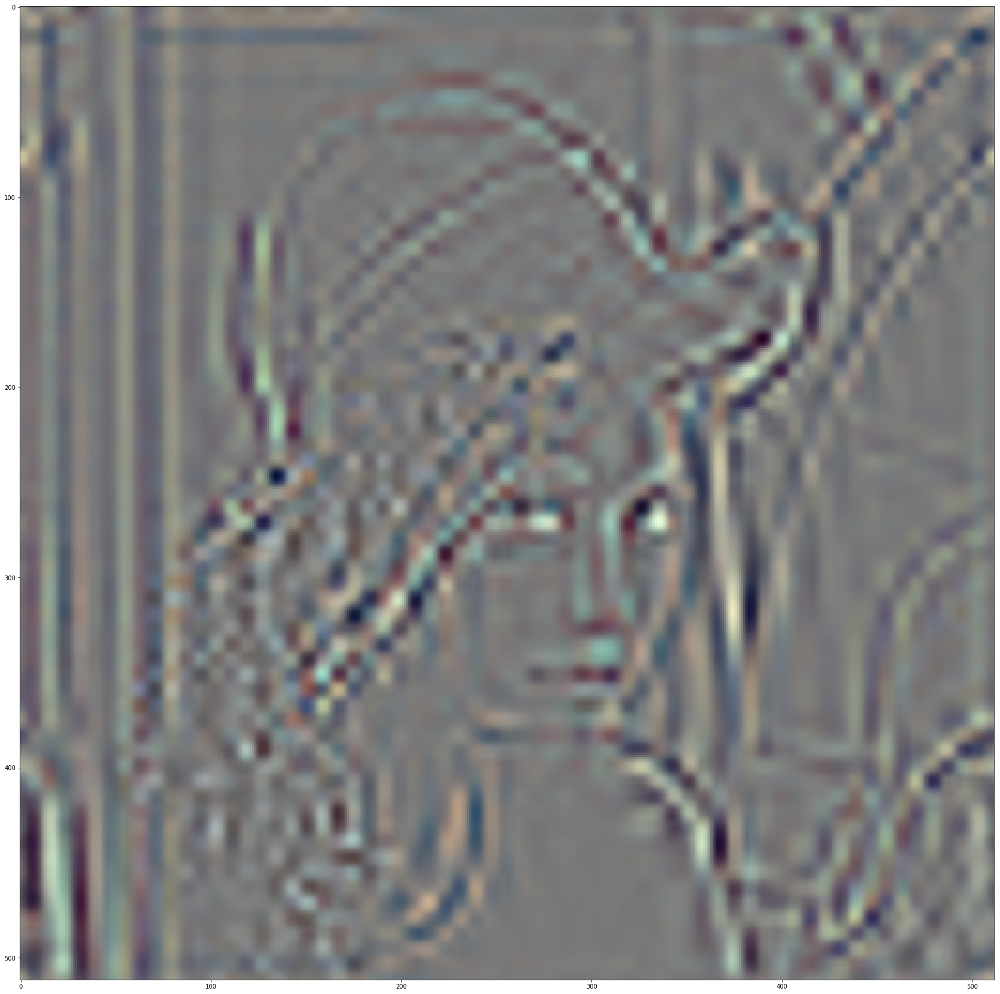

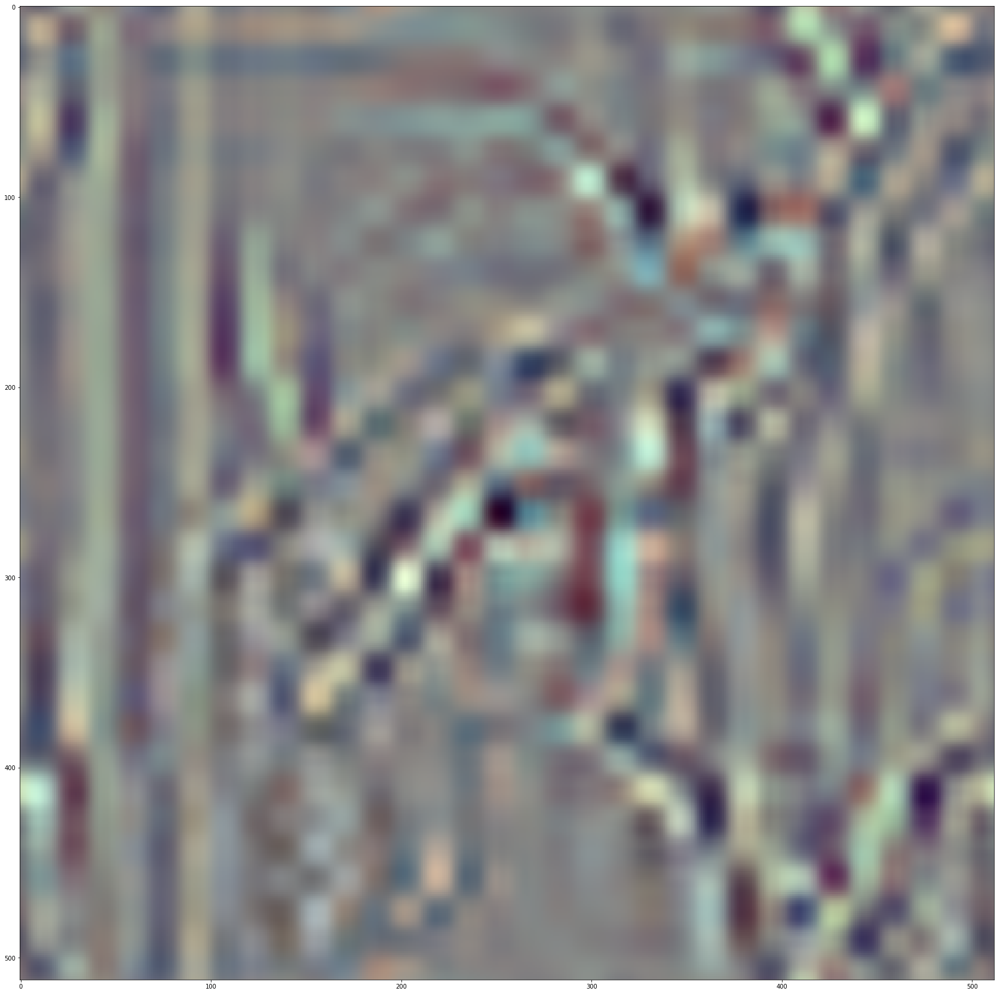

In [12]:
# Interpolated Laplacian pyramid
i_H_ = levels*[None]
i_H_[0] = _H_[0]
show(cv2.merge(i_H_[0]))
for l in range(1,levels):
    i_H_[l] = _H_[l]
    for ll in range(l):
        zero = np.zeros(i_H_[l][0].shape, np.float32)
        for c in range(3):
            i_H_[l][c] = iDWT((i_H_[l][c], (zero, zero, zero)), wavelet)
    show(cv2.merge(i_H_[l]))
iL = L
for ll in range(levels):
    zero = np.zeros(iL[0].shape, np.float32)
    for c in range(3):
        iL[c] = iDWT((iL[c], (zero, zero, zero)), wavelet)

In [15]:
print(i_H_[0][0].max(), i_H_[0][0].min())

54.847583539719054 -63.873883544906455


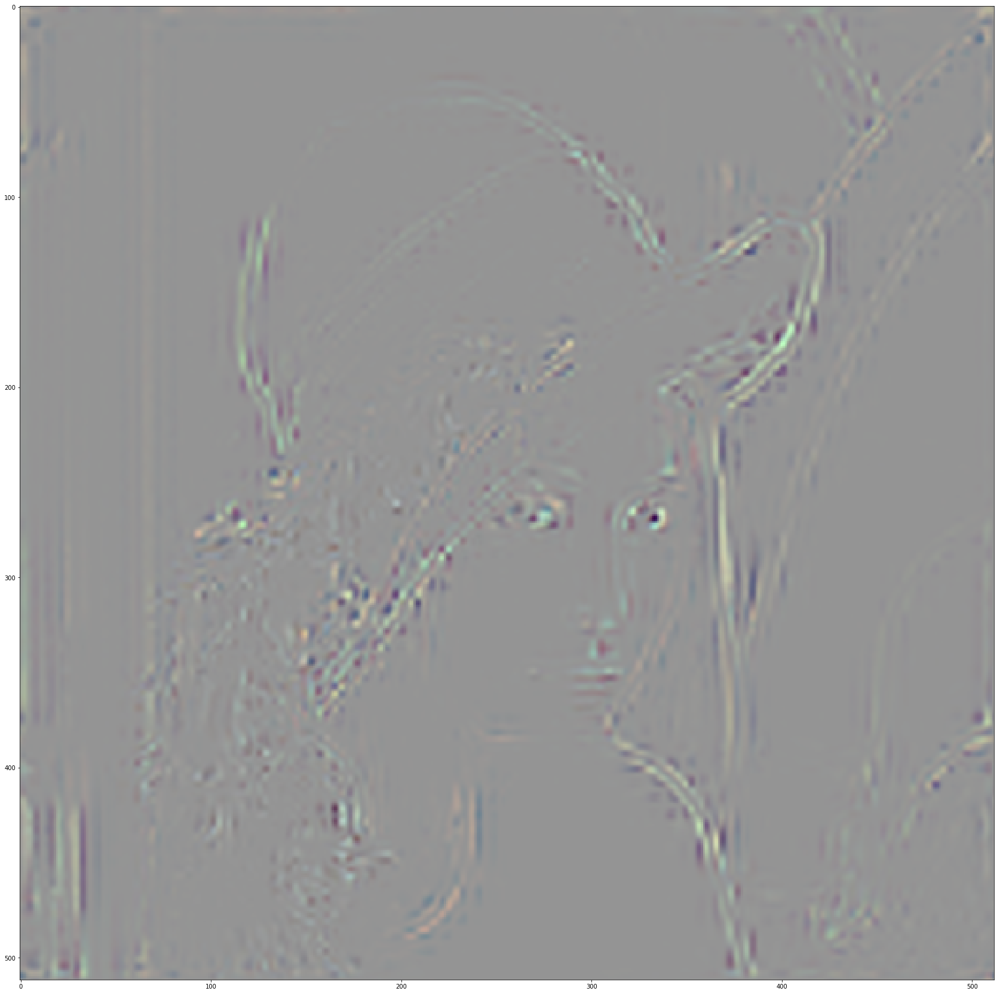

In [16]:
show(cv2.merge(i_H_[2])*cv2.merge(i_H_[3]))

In [17]:
i_H_[0][0].shape

(512, 512)

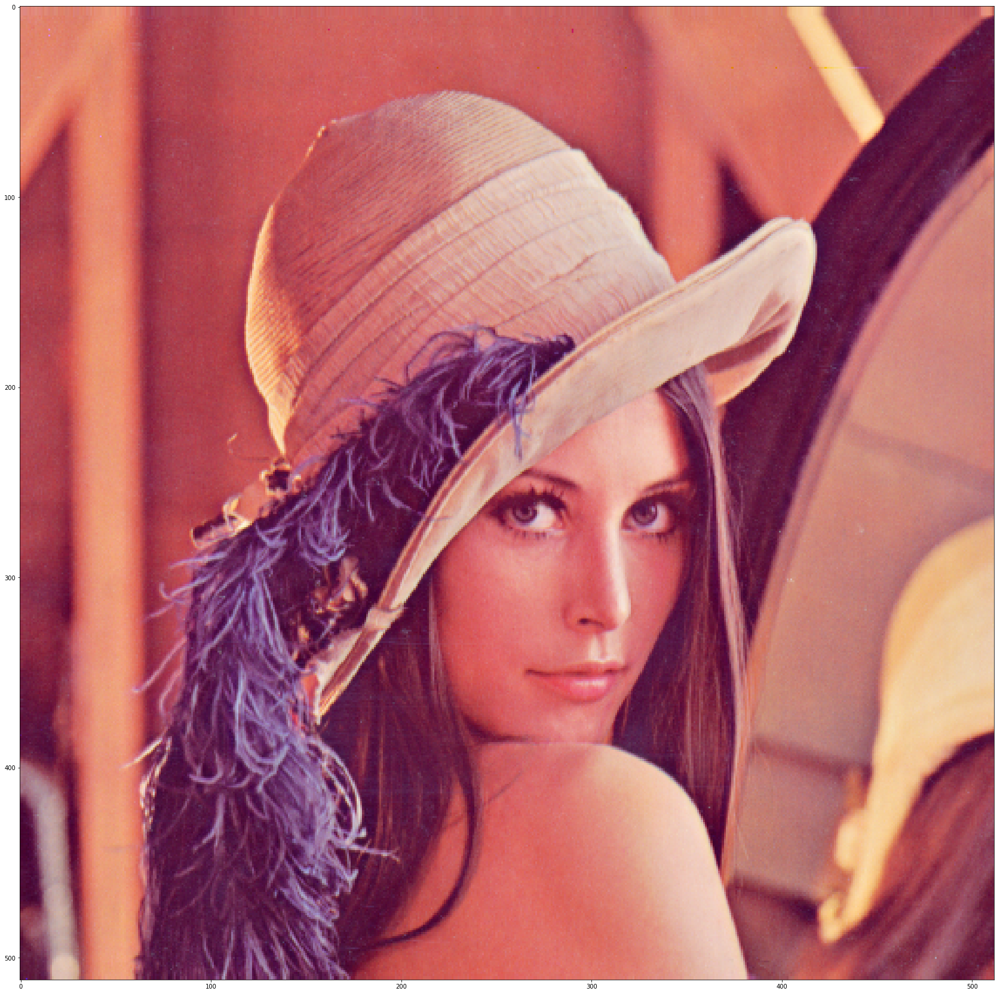

In [18]:
# Reconstruction using the interpolated pyramid
sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [19]:
psnr(cv2.merge(sum), image)

310.2402652205243

In [20]:
ssim(image, cv2.merge(sum), data_range=cv2.merge(sum).max() - cv2.merge(sum).min(), multichannel=True)

1.0000000000000056

In [21]:
def estimate_frame(reference, flow):
    height, width = flow.shape[:2]
    map_x = np.tile(np.arange(width), (height, 1))
    map_y = np.swapaxes(np.tile(np.arange(height), (width, 1)), 0, 1)
    map_xy = (flow + np.dstack((map_x, map_y))).astype('float32')
    return cv2.remap(reference, map_xy, None, 
            interpolation=cv2.INTER_LINEAR,
            borderMode=cv2.BORDER_REPLICATE)

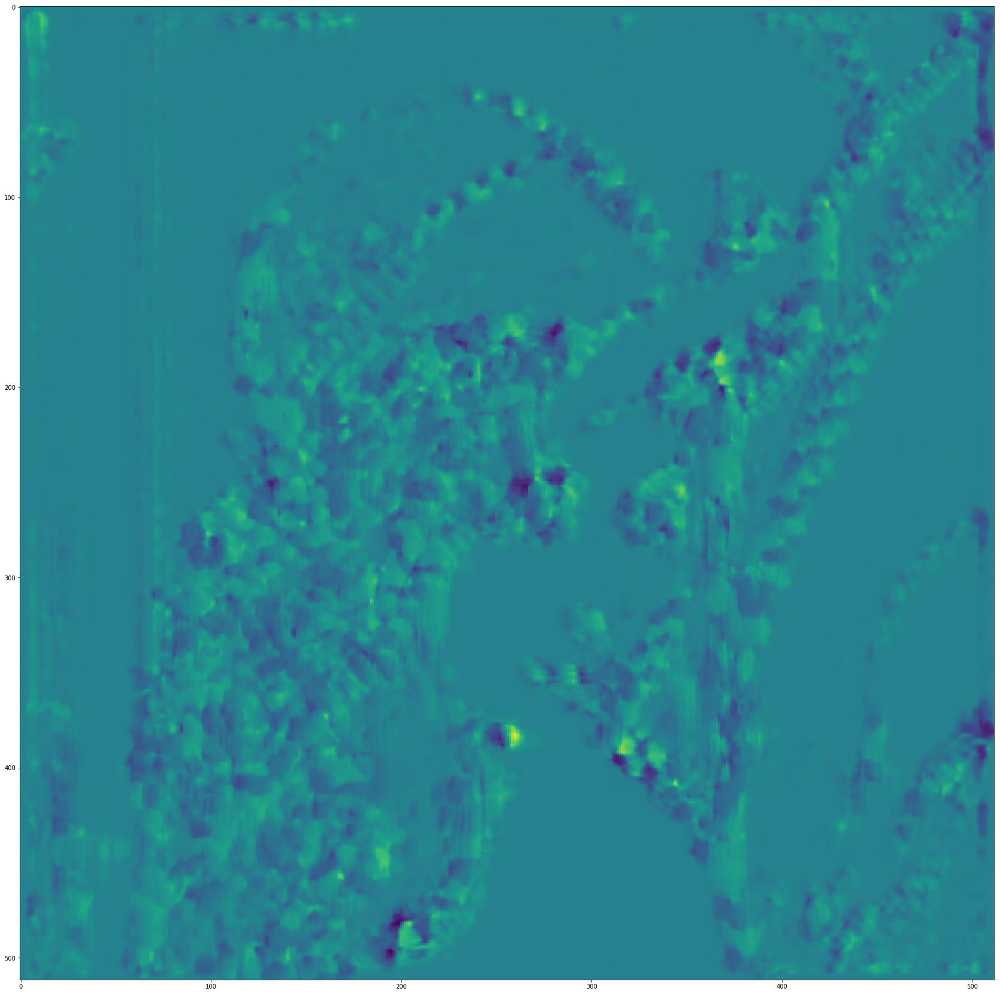

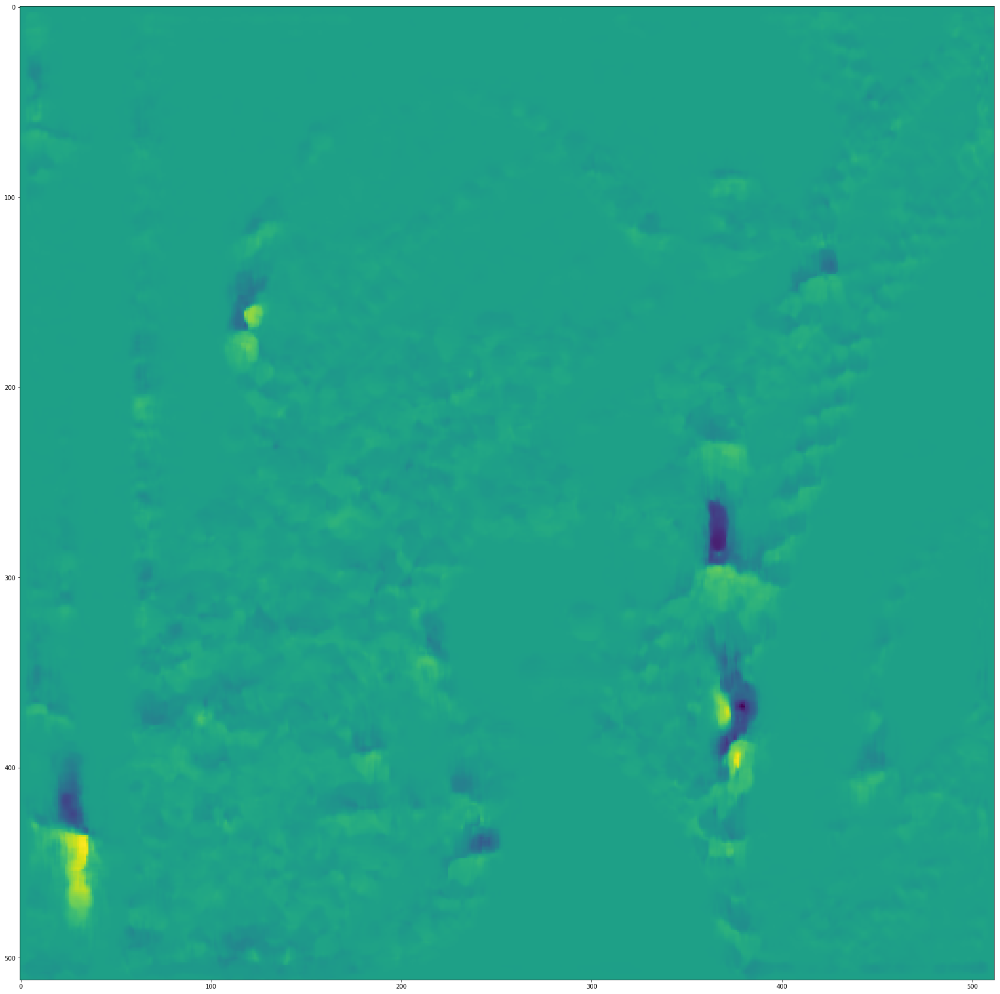

In [22]:
# Estimate optical flow
flow = 3*[None]
for c in range(3):
    flow[c] = cv2.calcOpticalFlowFarneback(
        prev=i_H_[1][c],
        next=i_H_[2][c],
        flow=None,
        pyr_scale=0.5,
        levels=5,
        winsize=5,
        iterations=1,
        poly_n=7,
        poly_sigma=1.5,
        flags=0)
show(flow[0][:,:,0])
show(flow[0][:,:,1])

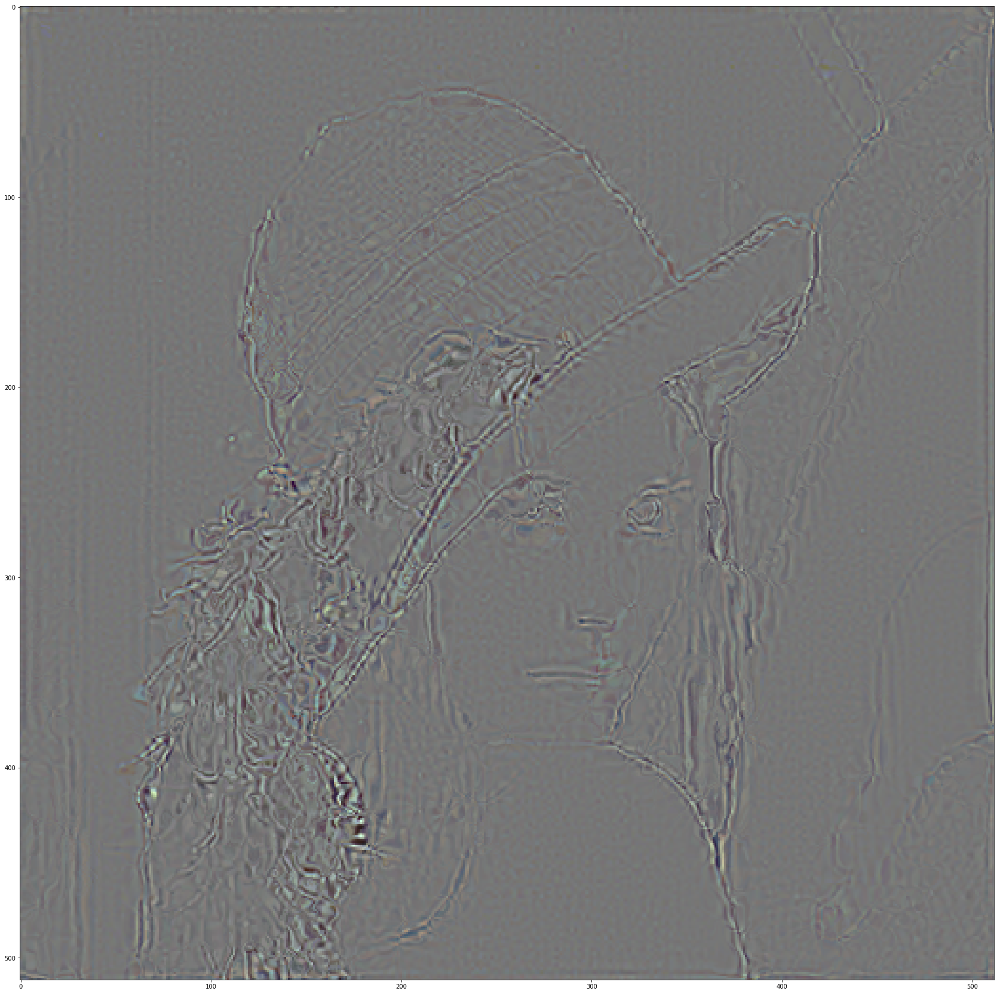

In [23]:
average_flow = (flow[0] + flow[1] + flow[2])/3
estimation = 3*[None]
for c in range(3):
    estimation[c] = estimate_frame(i_H_[1][c], average_flow)
show(cv2.merge(estimation))

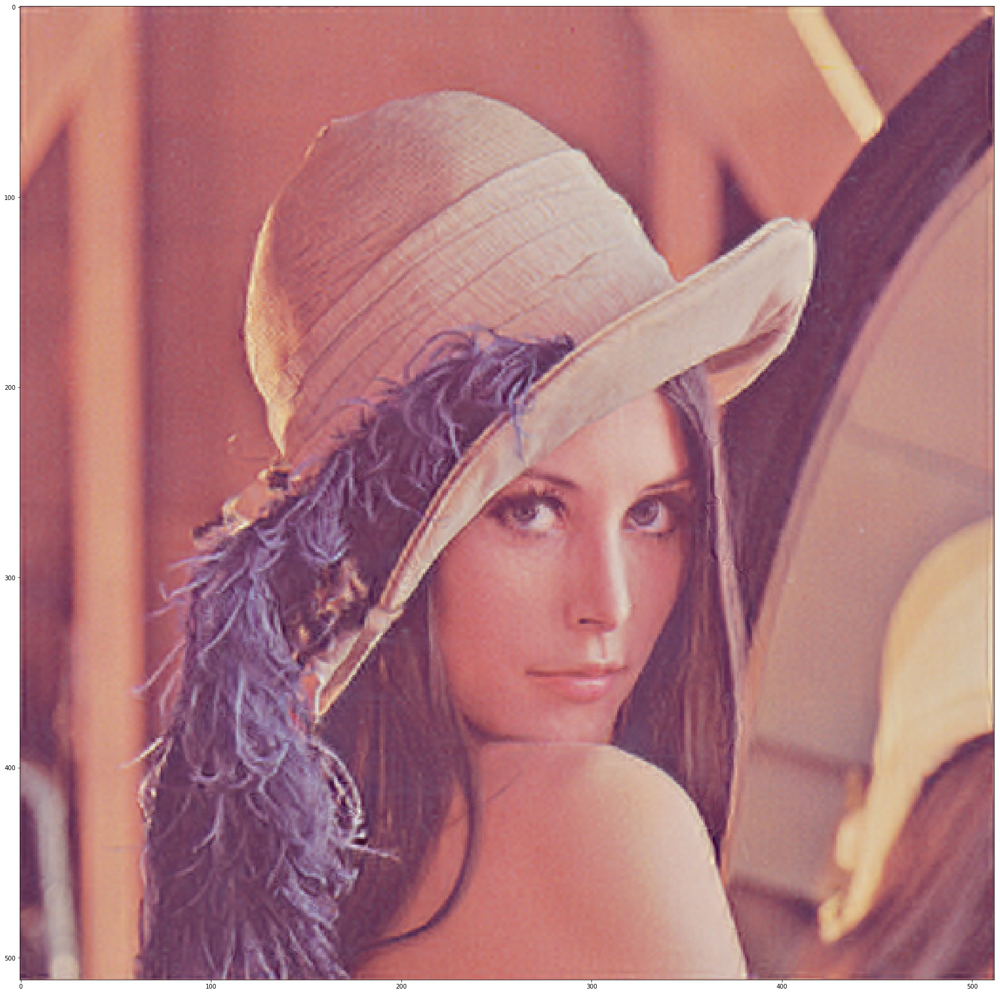

In [24]:
# Reconstruction using the estimated H1 subband

i_H_[0] = estimation

sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [26]:
print(i_H_[1][0].max(), i_H_[1][0].min())
print(i_H_[0][0].max(), i_H_[0][0].min())

75.8266438162089 -76.36516143801207
66.04361802126571 -62.69251910236246


In [ ]:
psnr(cv2.merge(sum), image)

In [ ]:
ssim(image, cv2.merge(sum), data_range=cv2.merge(sum).max() - cv2.merge(sum).min(), multichannel=True)

In [ ]:
# Reconstruction without the estimated H1 subband

i_H_[0] = [np.zeros(i_H_[0][0].shape), np.zeros(i_H_[0][0].shape), np.zeros(i_H_[0][0].shape)]

sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [ ]:
psnr(cv2.merge(sum), image)

In [ ]:
ssim(image, cv2.merge(sum), data_range=cv2.merge(sum).max() - cv2.merge(sum).min(), multichannel=True)

In [ ]:
# Estimate optical flow using normalized subbands
flow = 3*[None]
for c in range(3):
    flow[c] = cv2.calcOpticalFlowFarneback(
        prev=(i_H_[1][c]-i_H_[1][c].min())/(i_H_[1][c].max()-i_H_[1][c].min())*255,
        next=(i_H_[2][c]-i_H_[2][c].min())/(i_H_[2][c].max()-i_H_[2][c].min())*255,
        flow=None,
        pyr_scale=0.5,
        levels=5,
        winsize=5,
        iterations=1,
        poly_n=7,
        poly_sigma=1.5,
        flags=0)
show(flow[0][:,:,0])
show(flow[0][:,:,1])

In [ ]:
average_flow = (flow[0] + flow[1] + flow[2])/3
estimation = 3*[None]
for c in range(3):
    estimation[c] = estimate_frame(i_H_[1][c], average_flow)
show(cv2.merge(estimation))

In [ ]:
# Reconstruction using the estimated H1 subband

i_H_[0] = estimation

sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [ ]:
# Reconstruction without the estimated H1 subband

i_H_[0] = [np.zeros(i_H_[0][0].shape), np.zeros(i_H_[0][0].shape), np.zeros(i_H_[0][0].shape)]

sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [ ]:
# Compensating every component independently

estimation = 3*[None]
for c in range(3):
    estimation[c] = estimate_frame(i_H_[1][c], flow[c])
show(cv2.merge(estimation))

In [ ]:
# Reconstruction using the estimated H1 subband

i_H_[0] = estimation

sum = 3*[None]
for c in range(3):
    sum[c] = np.zeros(i_H_[0][0].shape)
for l in range(levels):
    for c in range(3):
        sum[c] += i_H_[l][c]
for c in range(3):
    sum[c] += iL[c]
show(cv2.merge(sum))

In [ ]:
# Compensating in the YUV domain